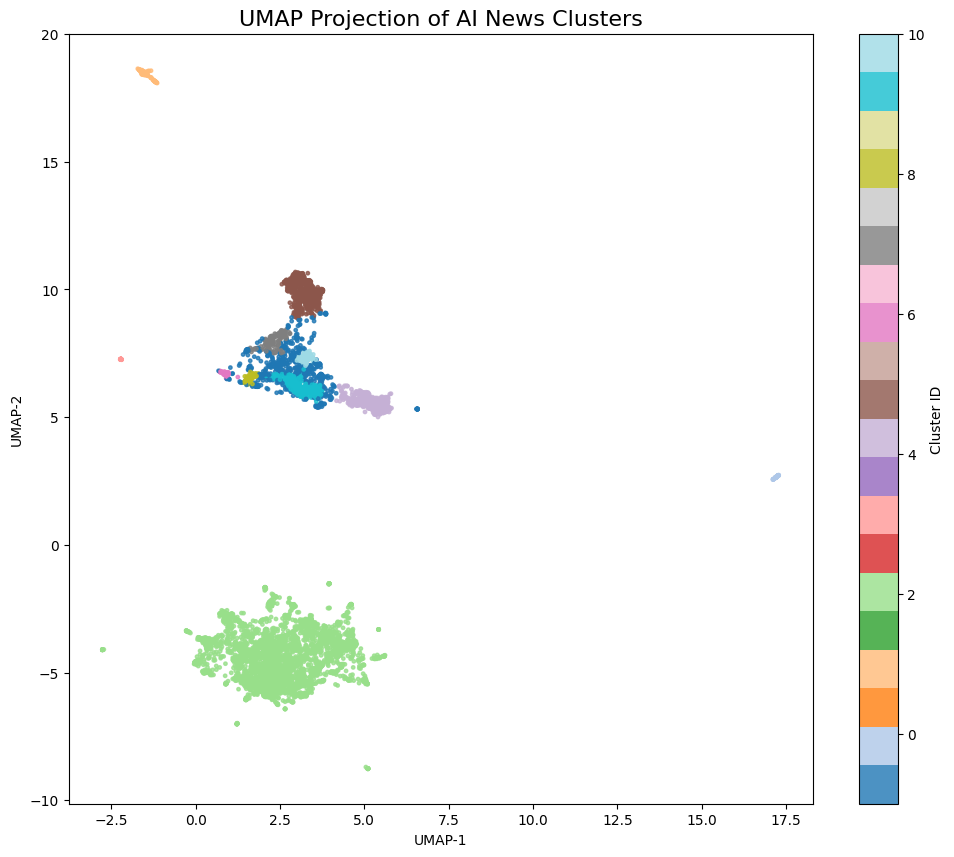

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
reduced = np.load("results_cluster/01_umap_reduced.npy")
df = pd.read_csv("results_cluster/02_cluster_labels.csv")

plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    reduced[:,0], reduced[:,1],
    c=df["cluster"],
    cmap="tab20",
    s=6,
    alpha=0.8
)

plt.colorbar(scatter, label="Cluster ID")
plt.title("UMAP Projection of AI News Clusters", fontsize=16)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")

plt.savefig("results_cluster/plot_umap_clusters.png", dpi=300, bbox_inches='tight')
plt.show()


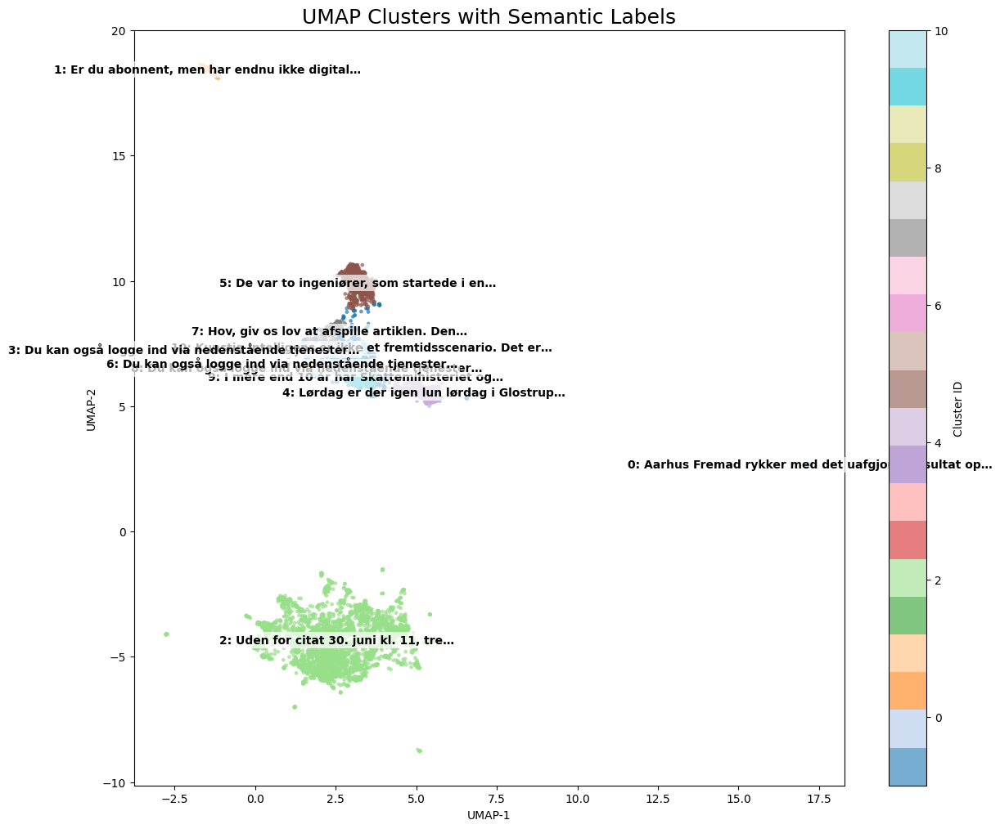

In [9]:
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt

# Load UMAP 结果 (N, 2)
reduced = np.load("results_cluster/01_umap_reduced.npy")

# Load df with cluster labels
df = pd.read_csv("results_cluster/02_cluster_labels.csv")

# Load summaries
with open("results_cluster/05_cluster_label_sentences.json", "r", encoding="utf-8") as f:
    summaries = json.load(f)

# Load centroids (dictionary of cid: vector)
centroids = np.load("results_cluster/03_cluster_centroids.npy", allow_pickle=True).item()

cluster_coords = {}

for cid in df["cluster"].unique():
    if cid == -1:
        continue  # skip noise cluster
    pts = reduced[df["cluster"] == cid]
    cx, cy = pts[:,0].mean(), pts[:,1].mean()
    cluster_coords[cid] = (cx, cy)

def shorten(text, max_words=8):
    words = text.split()
    if len(words) <= max_words:
        return text
    return " ".join(words[:max_words]) + "…"

cluster_labels = {cid: shorten(label) for cid, label in summaries.items()}
plt.figure(figsize=(14, 12))

# Draw scatter
scatter = plt.scatter(
    reduced[:,0], reduced[:,1],
    c=df["cluster"],
    cmap="tab20",
    s=6,
    alpha=0.6
)

plt.colorbar(scatter, label="Cluster ID")

# Add labels at centroids
for cid, (cx, cy) in cluster_coords.items():
    text = f"{cid}: {cluster_labels[str(cid)]}"
    plt.text(
        cx, cy,
        text,
        fontsize=10,
        weight="bold",
        ha="center",
        va="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=2)
    )

plt.title("UMAP Clusters with Semantic Labels", fontsize=18)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")

plt.savefig("results_cluster/plot_umap_semantic_labels.png", dpi=300, bbox_inches='tight')
plt.show()


In [7]:
centroids

{np.int64(0): array([ 2.16107313e-02,  4.47447263e-02,  6.58007897e-03,  5.06532937e-02,
        -5.98082617e-02,  1.32431639e-02,  8.13282728e-02,  1.70083519e-03,
         4.41852808e-02, -1.80742834e-02,  3.19944462e-03, -8.93870462e-03,
         1.67722777e-02, -1.85332925e-03, -2.06086058e-02,  2.12153886e-03,
         4.24286909e-02,  6.40237937e-03, -3.39159742e-02, -5.05477451e-02,
         1.29994750e-02,  2.99082249e-02, -3.33126523e-02,  4.98130592e-03,
         8.98485854e-02, -5.39953448e-03,  1.70065351e-02, -2.54718456e-02,
         5.39106838e-02,  4.05892171e-02,  1.29986862e-02, -2.69208644e-02,
         6.05942495e-03, -1.79169569e-02,  2.68501412e-06,  3.88335139e-02,
         1.81211513e-02,  2.65007070e-03, -1.26792863e-02, -5.32495975e-03,
        -3.73134799e-02, -3.14323530e-02, -3.64265032e-02, -3.35242711e-02,
        -4.64276411e-03, -2.42881551e-02, -1.99608486e-02, -1.52098341e-02,
         5.25854155e-02,  4.24155742e-02,  2.33672000e-02,  1.42590059e-02,